**1**. 

The following iterative sequence is defined for the set of positive integers:

- n → n/2 (n is even)
- n → 3n + 1 (n is odd)

Using the rule above and starting with 13, we generate the following sequence:

13 → 40 → 20 → 10 → 5 → 16 → 8 → 4 → 2 → 1

It can be seen that this sequence (starting at 13 and finishing at 1) contains 10 terms. Although it has not been proved yet (Collatz Problem), it is thought that all starting numbers finish at 1.

Which starting number, under one million, produces the longest chain?

NOTE: Once the chain starts the terms are allowed to go above one million.

**2**. Simulate 1000 flips of a fair coin, using 'H' for heads and 'T' for tails, and store the results as a string. Count the number of times at least 5 heads occur consecutively.

- Do this using a regex
- Do this without using a regex

**3**. Create this matrix using `np.fromfunction` 

```
array([[18, 13, 10,  9, 10, 13, 18],
       [13,  8,  5,  4,  5,  8, 13],
       [10,  5,  2,  1,  2,  5, 10],
       [ 9,  4,  1,  0,  1,  4,  9],
       [10,  5,  2,  1,  2,  5, 10],
       [13,  8,  5,  4,  5,  8, 13],
       [18, 13, 10,  9, 10, 13, 18]])
```

**4**.

Implement the Drossel and Schwabl forest fire model using the [description](https://en.wikipedia.org/wiki/Forest-fire_model#/media/File:Forest_fire_model.gif) from Wikipedia. Your final solution should be similar to the video `forest_fire.mp4` in the homework folder.

```
The model is defined as a cellular automaton on a grid with Ld cells. L is the sidelength of the grid and d is its dimension. A cell can be empty, occupied by a tree, or burning. The model of Drossel and Schwabl (1992) is defined by four rules which are executed simultaneously:
A burning cell turns into an empty cell
A tree will burn if at least one neighbor is burning
A tree ignites with probability f even if no neighbor is burning
An empty space fills with a tree with probability p
```

- Parameters for the simulation are
```python
steps = 200  # Number of steps
p = 0.03     # Probability of EMPTY -> TREE
f = p * 0.01 # Probability of TREE -> FIRE
n = 200      # Length of square grid
steps = 200  # Number of simulation steps
```
- You need to write code create an array named `sim` with shape (steps, n, n)
- **Note**: Your code should make use of `numpy` optimizations as much as possible - the simulation itself takes less than a second to complete on my fairly old desktop
- Now create a plot as shown from the `sims` array
![](./forest_fire.png)
- Code to display an animation of the `sims` array is provided
- Your animation should be similar to the one shown

Hints:

- For simplicity, assume that the borders of the simulation grid are fixed so they are always empty (the borders are *outside* the 100 by 100 grid you are saving at each step.
- Use marginalization to get the required numbers for the plot of population sizes over time
- Use *views* liberally - they do not incur the cost of a copy


In [1]:
from IPython.display import Video

Video("forest_fire.mp4")

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.animation as animation
from IPython.display import HTML
import numpy as np
np.random.seed(123)

In [3]:
EMPTY, TREE, BURN = 0, 1, 2

In [4]:
steps = 200  # Number of steps
p = 0.03     # Probability of EMPTY -> TREE
f = p * 0.01 # Probability of TREE -> FIRE
n = 200      # Length of square grid

In [5]:
%%time

def simulate(steps, p, f, n):
    """Generate stacked array of 2D matrices representing state of forest fire.
    
    The model is defined as a cellular automaton on a grid with Ld cells. 
    L is the sidelength of the grid and d is its dimension. 
    A cell can be empty, occupied by a tree, or burning. 
    The model of Drossel and Schwabl (1992) is defined by four rules which are executed simultaneously:
    
    A burning cell turns into an empty cell
    A tree will burn if at least one neighbor is burning
    A tree ignites with probability f even if no neighbor is burning
    An empty space fills with a tree with probability p
    """

    sim = np.zeros((steps, n, n))
    
    # pad with 1 cell on both sides for shifted overlays
    grid = np.zeros((n+2, n+2)).astype('int')
    for step in range(steps):
        burning_nbrs = (
            (grid[0:-2, 0:-2] == BURN) |
            (grid[0:-2, 1:-1] == BURN) | 
            (grid[0:-2, 2:]   == BURN) |
            (grid[1:-1, 0:-2] == BURN) |                 
            (grid[1:-1, 2:]   == BURN) |
            (grid[2:, 0:-2]   == BURN) | 
            (grid[2:, 1:-1]   == BURN) |
            (grid[2:, 2:]     == BURN)
        )

        # use central n by n grid as forest
        forest = grid[1:-1, 1:-1]

        # burnt out tree
        forest[forest == BURN] = EMPTY
        # lightning strike
        forest[(forest == TREE) & (np.random.uniform(0, 1, (n, n)) < f)] = BURN
        # contagious fire from neighbor
        forest[(forest == TREE) & (burning_nbrs >= 1)] = BURN
        # growth of new tree
        forest[(forest == EMPTY) & (np.random.uniform(0, 1, (n, n)) < p)] = TREE
        sim[step] = forest
    return sim

sim = simulate(steps, p, f, n)

CPU times: user 176 ms, sys: 7.98 ms, total: 184 ms
Wall time: 183 ms


In [6]:
# Your code to make the first plot here

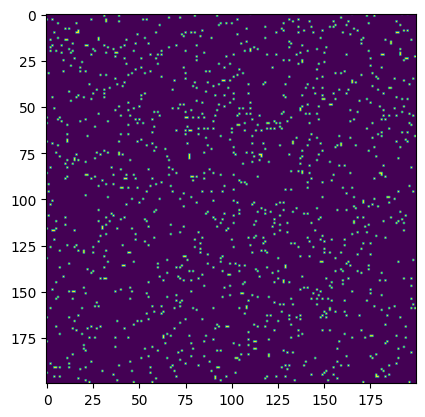

In [7]:
plt.imshow(sim[0])
pass

# Check movie

If your `sim` array is correct, the animation will play upon execution. It takes a bit of time (< 1 minute) to genreate the animation and render to HTML.

In [8]:
%%capture

fig = plt.figure(figsize=(6,6))
im = plt.imshow(sim[0], cmap=ListedColormap(['black', 'green', 'red']), vmin=0, vmax=2)

def updatefig(j):
    im.set_array(sim[j])
    return [im]

ani = animation.FuncAnimation(fig, updatefig, frames=range(steps), 
                              interval=50, blit=True);

In [9]:
%%time

HTML(ani.to_jshtml())

CPU times: user 11.8 s, sys: 292 ms, total: 12.1 s
Wall time: 11.7 s


To write to file if you have ffmpeg instaled

```python 
Writer = animation.writers['ffmpeg']
writer = Writer(fps=15, metadata=dict(artist='Me'), bitrate=1800)
ani.save('forest_fire.mp4', writer=writer)
```